In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 719 kB 13.6 MB/s 
     |████████████████████████████████| 5.8 MB 54.4 MB/s 
     |████████████████████████████████| 1.3 MB 52.1 MB/s 
     |████████████████████████████████| 451 kB 75.7 MB/s 
     |████████████████████████████████| 1.6 MB 49.9 MB/s 
     |████████████████████████████████| 212 kB 35.2 MB/s 
     |████████████████████████████████| 182 kB 11.0 MB/s 
     |████████████████████████████████| 132 kB 65.7 MB/s 
     |████████████████████████████████| 127 kB 7.7 MB/s 
     |████████████████████████████████| 7.6 MB 63.7 MB/s 
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [38]:
ims = ['https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTGwWifyXrgTDFTWewqF3cDHYtLKmJ4-PjBEA&usqp=CAU']

In [39]:
dest = 'images/monkey.jpg'
download_url(ims[0], dest)

Path('images/monkey.jpg')

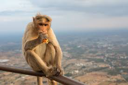

In [40]:
im = Image.open(dest)
im.to_thumb(128,128)

## Use DuckDuckGo to get data

In [3]:
animal_types = 'cat','dog', 'monkey'
path = Path('animal')

In [6]:
if not path.exists():
    path.mkdir()
    for o in animal_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_ddg(f'{o} animal')
        download_images(dest, urls=results)

In [7]:
fns = get_image_files(path)
fns

(#580) [Path('animal/cat/6f6a989e-2e38-4af2-ace3-77636027001e.jpg'),Path('animal/cat/6139e973-a0e8-4c4b-b9cc-c00cc9943a32.jpg'),Path('animal/cat/ac512903-05ff-44d1-90bf-782ce4c78a06.jpg'),Path('animal/cat/d69e037a-baee-44b2-a7b5-30ced75c43b1.jpg'),Path('animal/cat/ffe6f4f8-47eb-40a8-a787-2a86db81d981.jpg'),Path('animal/cat/b2c15e74-5a82-4f46-ad62-015c28c285fd.jpg'),Path('animal/cat/6e0b15be-15c9-4777-a3e6-c50aa875e980.jpeg'),Path('animal/cat/a5d557de-2387-4300-b14f-dfd83e708de8.jpg'),Path('animal/cat/012e44ba-4873-4212-914b-7294edfa1844.jpg'),Path('animal/cat/389e851b-d4d9-4d4b-8216-2f31dde4c4cf.jpg')...]

In [8]:
len(fns)

580

In [9]:
failed = verify_images(fns)
failed

(#10) [Path('animal/cat/d4d16883-ee0e-43f1-ab3e-0e0a5d518955.jpg'),Path('animal/cat/52aa2a88-f038-45db-8c55-80ec5ef96503.jpg'),Path('animal/cat/f2425d7e-e9ae-4697-8637-daac018a3dfe.jpg'),Path('animal/cat/131de472-9c35-441e-8f6c-6ca08164790d.jpg'),Path('animal/cat/ad89d157-6fc8-46a3-a370-472b3a221a3d.jpg'),Path('animal/cat/c50affd1-00da-4512-a7b2-d9b86b49667f.jpg'),Path('animal/dog/fe930974-2a22-4c6e-a083-5e14b7497e7f.jpg'),Path('animal/monkey/bc1d7177-beba-4e6b-8208-5aed5f153f43.jpg'),Path('animal/monkey/604135e6-743c-4170-b2d7-20afbc9be356.jpg'),Path('animal/monkey/67772121-95a2-427a-b75d-1fb14d9f7b1c.jpg')]

In [10]:
failed.map(Path.unlink);

## From Data to DataLoaders

In [19]:
animal = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [20]:
dls = animal.dataloaders(path)

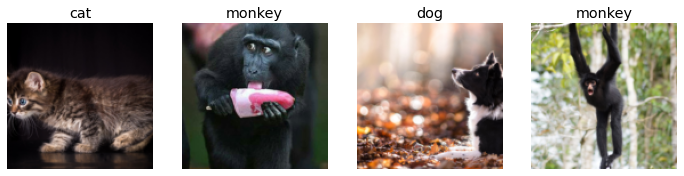

In [21]:
dls.valid.show_batch(max_n=4, nrows=1)

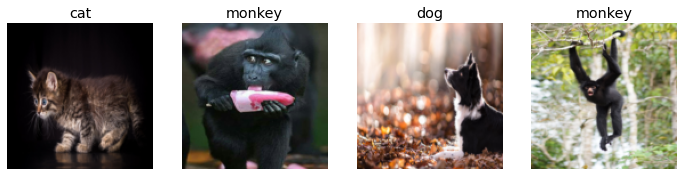

In [22]:
animal = animal.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = animal.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

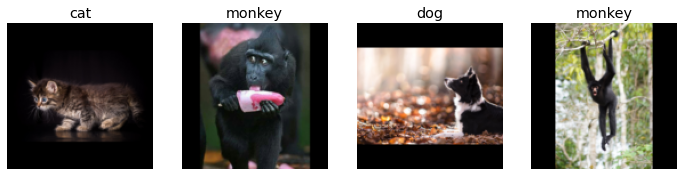

In [23]:
animal = animal.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = animal.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

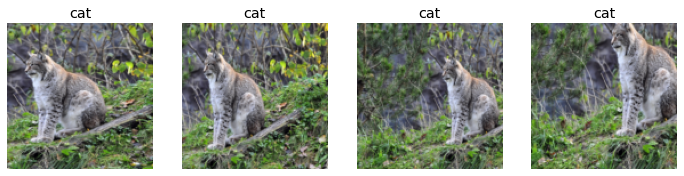

In [24]:
animal = animal.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = animal.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

### Data Augmentation

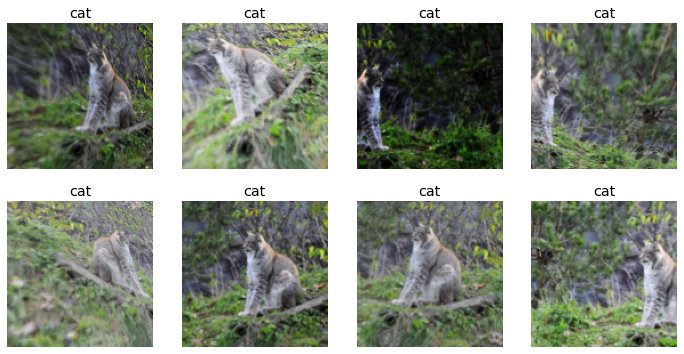

In [26]:
animal = animal.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = animal.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training Your Model, and Using It to Clean Your Data

In [27]:
animal = animal.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = animal.dataloaders(path)

In [28]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.402318,0.064258,0.026316,00:32


epoch,train_loss,valid_loss,error_rate,time
0,0.232102,0.041061,0.017544,00:35
1,0.167618,0.081487,0.026316,00:32
2,0.125405,0.078035,0.026316,00:31
3,0.111049,0.079294,0.035088,00:32


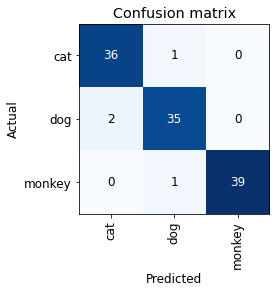

In [29]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

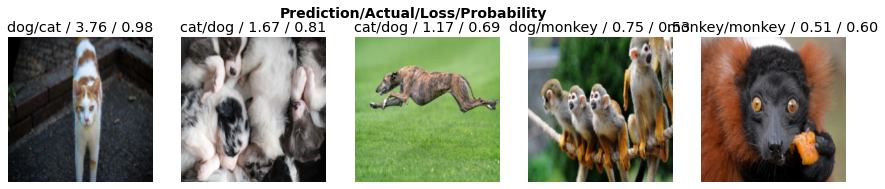

In [30]:
interp.plot_top_losses(5, nrows=1)

In [31]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [32]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

## Turning Your Model into an Online Application

### Using the Model for Inference

In [33]:
learn.export()

In [34]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [35]:
learn_inf = load_learner(path/'export.pkl')

In [42]:
learn_inf.predict('images/monkey.jpg')

('monkey', TensorBase(2), TensorBase([3.0522e-05, 2.1745e-01, 7.8252e-01]))

In [43]:
learn_inf.dls.vocab

['cat', 'dog', 'monkey']

### Creating a Notebook App from the Model

In [44]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [45]:
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['images/monkey.jpg'])

In [46]:
img = PILImage.create(btn_upload.data[-1])

In [47]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [48]:
pred,pred_idx,probs = learn_inf.predict(img)

In [49]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: monkey; Probability: 0.7825')

In [50]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [51]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [52]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [53]:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])